# NBLAST
NBLAST (Costa et al., 2016) is a method to quantify morphological similarity. It works on "dotprops" which represent neurons as tangent vectors. For each tangent vector in the query neuron, NBLAST finds the closest tangent vector in the target neuron and calculates a score from the distance between and the dotproduct of the two vectors. The final NBLAST score is the sum over all query-target vector pairs. Typically, this score is normalized to a self-self comparison (i.e. a perfect match would be 1).

![nblast](../sta/neuron_comparison.png)

VFB computes NBLAST scores for all (?) neurons in its database. So if all you want is a list of similar neurons, it's fastest (and easiest) to get those directly from VFB.

In [ ]:
# Import libs and initialise API objects
from vfb_connect.cross_server_tools import VfbConnect
import navis.interfaces.neuprint as neu

import pandas as pd
import navis

navis.set_pbars(jupyter=False)

vc = VfbConnect()
# client = neu.Client('https://neuprint.janelia.org', dataset='hemibrain:v1.1')

First let's write a little function to grab VFB neurons and turn them into `navis` neurons. This is modified from `vc.neo_query_wrapper.get_images`.

In [ ]:
import requests
from tqdm import tqdm

def get_vfb_neurons(vfb_ids, template='JRC2018Unisex'):
    """Load neurons from VFB as navis.TreeNeurons."""
    vfb_ids = list(navis.utils.make_iterable(vfb_ids))
    inds = vc.neo_query_wrapper.get_anatomical_individual_TermInfo(short_forms=vfb_ids)
    nl = []
    # Note: queries should be parallelized in the future 
    # -> for pymaid I use request-futures which works really well
    for i in tqdm(inds, desc='Loading VFB neurons', leave=False):        
        if not ('has_image' in i['term']['core']['types']):
            continue
        label = i['term']['core']['label']
        image_matches = [x['image'] for x in i['channel_image']]
        if not image_matches:
            continue
        for imv in image_matches:
            if imv['template_anatomy']['label'] == template:
                r = requests.get(imv['image_folder'] + '/volume.swc')
                ### Slightly dodgy warning - could mask network errors
                if not r.ok:
                    warnings.warn("No '%s' file found for '%s'." % (image_type, label))
                    continue

                # `id` should ideally be unique but that's not enforced
                n = navis.TreeNeuron(r.text, name=label, id=i['term']['core']['short_form'])   

                # This registers attributes that you want to show in the summary
                # alternatively we could have a generic attribute like so:
                # n.template = template
                n._register_attr("template", template, temporary=False)

                # I assume all available templates are in microns?
                # @Robbie -do we have this metadata on templates?  If not, we should add ASAP.
                n.units = '1 micron'

                nl.append(n)
    return navis.NeuronList(nl)

In [ ]:
# Search for similar neurons using the VFB ID of an ellipsoid body neuron in FAFB
# We got that ID from a search on the VFB website
similar_to_EPG6L1 = vc.get_similar_neurons('VFB_001012ay')
similar_to_EPG6L1.head()

,id,NBLAST_score,label,types,source_id,accession_in_source
0,VFB_jrchjtk6,0.525,EPG(PB08)_L6 (FlyEM-HB:541870397),[EB-PB 1 glomerulus-D/Vgall neuron],neuprint_JRC_Hemibrain_1point1,541870397
1,VFB_jrchjtk8,0.524,EPG(PB08)_L6 (FlyEM-HB:912601268),[EB-PB 1 glomerulus-D/Vgall neuron],neuprint_JRC_Hemibrain_1point1,912601268
2,VFB_jrchjtkb,0.504,EPG(PB08)_L6 (FlyEM-HB:788794171),[EB-PB 1 glomerulus-D/Vgall neuron],neuprint_JRC_Hemibrain_1point1,788794171
3,VFB_jrchjtji,0.481,EL(EQ5)_L (FlyEM-HB:1036753721),[EBw.AMP.s-Dga-s.b neuron],neuprint_JRC_Hemibrain_1point1,1036753721


In [ ]:
# Read those neurons from VFB 
query = get_vfb_neurons('VFB_001012ay')
matches = get_vfb_neurons(similar_to_EPG6L1.id.values)

In [ ]:
matches

,type,name,id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units,template
0,navis.TreeNeuron,EPG(PB08)_L6 (FlyEM-HB:788794171),VFB_jrchjtkb,9651,None,962,987,2125.364746,None,1 micron,JRC2018Unisex
1,navis.TreeNeuron,EPG(PB08)_L6 (FlyEM-HB:912601268),VFB_jrchjtk8,9819,None,1000,1015,2211.292236,None,1 micron,JRC2018Unisex
2,navis.TreeNeuron,EL(EQ5)_L (FlyEM-HB:1036753721),VFB_jrchjtji,13864,None,1942,1974,3403.311523,[1],1 micron,JRC2018Unisex
3,navis.TreeNeuron,EPG(PB08)_L6 (FlyEM-HB:541870397),VFB_jrchjtk6,11042,None,1099,1127,2432.101318,[1],1 micron,JRC2018Unisex


In [ ]:
# Define colors such that query is black 
import seaborn as sns 
colors = ['k'] + sns.color_palette('muted', len(matches))

navis.plot3d([query, matches], color=colors)

So that looks decent!

Next: Let's say you have a set of neurons and you want to group them into morphologically similar "types". To demonstrate this, we will take ellipsoid body (protocerebral bridge) neurons from VFB and cluster them using NBLAST.

In [ ]:
# Find instances of EB-PB neurons
eb_pb_ids = pd.DataFrame.from_records(vc.get_instances("eb-pb-vbo neuron"))
eb_pb_ids.head()

,label,symbol,id,tags,parents_label,parents_id,data_source,accession,templates,dataset,license
0,EPG(PB08)_L4 (FlyEM-HB:634962055),,VFB_jrchjtka,Entity|has_image|Adult|Anatomy|has_neuron_conn...,EB-PB 1 glomerulus-D/Vgall neuron,FBbt_00047030,neuprint_JRC_Hemibrain_1point1,634962055,JRC_FlyEM_Hemibrain|JRC2018Unisex,Xu2020NeuronsV1point1,https://creativecommons.org/licenses/by/4.0/le...
1,EPG(PB08)_R3 (FlyEM-HB:478375456),,VFB_jrchjtkh,Entity|has_image|Adult|Anatomy|has_neuron_conn...,EB-PB 1 glomerulus-D/Vgall neuron,FBbt_00047030,neuprint_JRC_Hemibrain_1point1,478375456,JRC2018Unisex|JRC_FlyEM_Hemibrain,Xu2020NeuronsV1point1,https://creativecommons.org/licenses/by/4.0/le...
2,EPG(PB08)_L6 (FlyEM-HB:788794171),,VFB_jrchjtkb,Entity|has_image|Adult|Anatomy|has_neuron_conn...,EB-PB 1 glomerulus-D/Vgall neuron,FBbt_00047030,neuprint_JRC_Hemibrain_1point1,788794171,JRC_FlyEM_Hemibrain|JRC2018Unisex,Xu2020NeuronsV1point1,https://creativecommons.org/licenses/by/4.0/le...
3,EPG(PB08)_L7 (FlyEM-HB:1035045015),,VFB_jrchjtkp,Entity|has_image|Adult|Anatomy|has_neuron_conn...,EB-PB 1 glomerulus-D/Vgall neuron,FBbt_00047030,neuprint_JRC_Hemibrain_1point1,1035045015,JRC2018Unisex|JRC_FlyEM_Hemibrain,Xu2020NeuronsV1point1,https://creativecommons.org/licenses/by/4.0/le...
4,EPG(PB08)_L5 (FlyEM-HB:696362840),,VFB_jrchjtk1,Entity|has_image|Adult|Anatomy|has_neuron_conn...,EB-PB 1 glomerulus-D/Vgall neuron,FBbt_00047030,neuprint_JRC_Hemibrain_1point1,696362840,JRC2018Unisex|JRC_FlyEM_Hemibrain,Xu2020NeuronsV1point1,https://creativecommons.org/licenses/by/4.0/le...


In [ ]:
# Get the neurons from VFB
eb_pb = get_vfb_neurons(eb_pb_ids.id.values)
eb_pb.head()

,type,name,id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units,template
0,navis.TreeNeuron,EPG(PB08)_R6 (FlyEM-HB:941132434),VFB_jrchjtkd,10217,None,1037,1056,2150.743164,[1],1 micron,JRC2018Unisex
1,navis.TreeNeuron,EPG(PB08)_L7 (FlyEM-HB:1035045015),VFB_jrchjtkp,12603,None,1344,1376,2696.999512,None,1 micron,JRC2018Unisex
2,navis.TreeNeuron,EPG(PB08)_L6 (FlyEM-HB:541870397),VFB_jrchjtk6,11042,None,1099,1127,2432.101318,[1],1 micron,JRC2018Unisex
3,navis.TreeNeuron,EPG(PB08)_L4 (FlyEM-HB:634962055),VFB_jrchjtka,10394,None,1127,1149,2381.758057,[1],1 micron,JRC2018Unisex
4,navis.TreeNeuron,EPG(PB08)_L2 (FlyEM-HB:697001770),VFB_jrchjtkw,12416,None,1352,1383,2776.181152,[1],1 micron,JRC2018Unisex


Now that we have the skeletons, we need to turn them into dotprops. Couple things to keep in mind:

1. NBLAST is optimized for data in microns. Since our neurons are in the `JRC2018Unisex` template, they already are. 
2. Neurons should have the same sampling rate (i.e. nodes per micron). To ensure this we will resample the neurons to 1 point per micron.
3. We won't be doing this this time around but we typically simplify the neurons slightly by e.g. pruning small twigs (`navis.prune_twigs()`) to reduce noise.

In [ ]:
eb_dps = navis.make_dotprops(eb_pb, resample=1, k=5)

# Note this neuronlist contains dotprops now
eb_dps.head()

,type,name,id,k,units,n_points
0,navis.Dotprops,EPG(PB08)_R6 (FlyEM-HB:941132434),VFB_jrchjtkd,5,1 micron,2338
1,navis.Dotprops,EPG(PB08)_L7 (FlyEM-HB:1035045015),VFB_jrchjtkp,5,1 micron,2939
2,navis.Dotprops,EPG(PB08)_L6 (FlyEM-HB:541870397),VFB_jrchjtk6,5,1 micron,2513
3,navis.Dotprops,EPG(PB08)_L4 (FlyEM-HB:634962055),VFB_jrchjtka,5,1 micron,2524
4,navis.Dotprops,EPG(PB08)_L2 (FlyEM-HB:697001770),VFB_jrchjtkw,5,1 micron,2966


To illustrate what dotprops are, lets visualize one side-by-side with its skeleton.

In [ ]:
sk = eb_pb[0].copy()
dp = eb_dps[0].copy()

# Slightly offset the dotprops by a micron 
dp.points[:, 0] += 1

navis.plot3d([sk, dp], color=['k', 'r'])

Now we can run the NBLAST. Note that in this case, we run an all-by-all NBLAST which means that we don't really have to worry about the directionality - i.e. whether we NBLAST A->B or B->A. 

In [ ]:
scores = navis.nblast_allbyall(eb_dps)
scores.head()

Blasting: 100%|██████████| 62/62 [00:14<00:00,  4.22it/s]


,VFB_jrchjtk6,VFB_jrchjtka,VFB_jrchjtkx,VFB_jrchjtkt,VFB_00004319,VFB_jrchjtk8,VFB_001012b4,VFB_jrchjtkq,VFB_jrchjtl8,VFB_jrchjtkr,...,VFB_00009714,VFB_jrchjtke,VFB_jrchjtk0,VFB_001012bb,VFB_jrchjtk7,VFB_jrchjtkz,VFB_jrchjtky,VFB_jrchjtl5,VFB_jrchjtk9,VFB_jrchjtkp
VFB_jrchjtk6,1.000000,0.156635,-0.139844,0.106216,-0.120740,0.827852,0.012692,0.429793,-0.122947,-0.166070,...,-0.050957,-0.100148,0.151471,0.805416,0.077482,0.289502,-0.149816,-0.139132,0.384506,0.461699
VFB_jrchjtka,0.230290,1.000000,-0.070167,-0.185787,-0.066810,0.211552,-0.077687,0.114231,-0.171548,-0.027296,...,0.643517,0.282711,0.822655,0.205867,0.450234,0.099226,-0.085160,-0.091801,0.203925,0.119521
VFB_jrchjtkx,-0.219941,-0.151549,1.000000,-0.087588,0.615585,-0.216902,-0.340719,-0.127873,0.163295,0.435455,...,0.061871,0.135616,-0.144217,-0.217370,-0.034310,-0.031291,0.823947,0.811210,-0.113117,-0.171434
VFB_jrchjtkt,0.131761,-0.103031,-0.056666,1.000000,-0.124431,0.172337,-0.127340,0.530561,0.431877,-0.143298,...,-0.142560,-0.122518,-0.091159,0.103465,-0.063922,0.493746,-0.114260,-0.070365,0.078412,0.507521
VFB_00004319,-0.226698,-0.211647,0.569286,-0.106367,1.000000,-0.224161,-0.322355,-0.171156,0.066581,0.262279,...,-0.094681,0.143821,-0.220668,-0.231762,0.005058,-0.087569,0.579287,0.581981,-0.062014,-0.179561


Next, we need to take those forward scores (A->B) and symmetrize by calculating mean scores (A<->B). 

In [ ]:
# Symmetrize scores
scores_mean = (scores + scores.T) / 2

scores_mean.head()

,VFB_jrchjtk6,VFB_jrchjtka,VFB_jrchjtkx,VFB_jrchjtkt,VFB_00004319,VFB_jrchjtk8,VFB_001012b4,VFB_jrchjtkq,VFB_jrchjtl8,VFB_jrchjtkr,...,VFB_00009714,VFB_jrchjtke,VFB_jrchjtk0,VFB_001012bb,VFB_jrchjtk7,VFB_jrchjtkz,VFB_jrchjtky,VFB_jrchjtl5,VFB_jrchjtk9,VFB_jrchjtkp
VFB_jrchjtk6,1.000000,0.193463,-0.179892,0.118989,-0.173719,0.830322,0.226013,0.414505,-0.105488,-0.180314,...,-0.011111,-0.110101,0.174906,0.801623,0.127265,0.212511,-0.198844,-0.174404,0.389127,0.448367
VFB_jrchjtka,0.193463,1.000000,-0.110858,-0.144409,-0.139228,0.162189,-0.002587,0.045828,-0.136497,-0.006458,...,0.584748,0.320848,0.817250,0.163665,0.507730,0.013821,-0.126325,-0.124715,0.229854,0.039535
VFB_jrchjtkx,-0.179892,-0.110858,1.000000,-0.072127,0.592436,-0.183174,-0.159982,-0.132868,0.207983,0.448524,...,-0.081556,0.183916,-0.092691,-0.156470,0.047508,-0.048944,0.825808,0.816849,-0.065908,-0.168435
VFB_jrchjtkt,0.118989,-0.144409,-0.072127,1.000000,-0.115399,0.176281,0.011329,0.516271,0.419604,-0.164992,...,-0.162311,-0.142672,-0.140557,0.120931,-0.075555,0.498252,-0.129180,-0.072354,0.074666,0.500718
VFB_00004319,-0.173719,-0.139228,0.592436,-0.115399,1.000000,-0.178592,-0.146043,-0.159965,0.151737,0.275272,...,-0.164684,0.130038,-0.151058,-0.153349,0.030211,-0.086245,0.594045,0.608638,-0.038636,-0.171488


From here on out, we use cookie cutter `scipy` to produce a hierarchical clustering. First we need to take those _similarity_ scores to _distances_ because that's what `scipy` operates on:

In [ ]:
dist_mean = (scores_mean - 1) * -1
dist_mean.head()

,VFB_jrchjtk6,VFB_jrchjtka,VFB_jrchjtkx,VFB_jrchjtkt,VFB_00004319,VFB_jrchjtk8,VFB_001012b4,VFB_jrchjtkq,VFB_jrchjtl8,VFB_jrchjtkr,...,VFB_00009714,VFB_jrchjtke,VFB_jrchjtk0,VFB_001012bb,VFB_jrchjtk7,VFB_jrchjtkz,VFB_jrchjtky,VFB_jrchjtl5,VFB_jrchjtk9,VFB_jrchjtkp
VFB_jrchjtk6,-0.000000,0.806537,1.179892,0.881011,1.173719,0.169678,0.773987,0.585495,1.105488,1.180314,...,1.011111,1.110101,0.825094,0.198377,0.872735,0.787489,1.198844,1.174404,0.610873,0.551633
VFB_jrchjtka,0.806537,-0.000000,1.110858,1.144409,1.139228,0.837811,1.002587,0.954172,1.136497,1.006458,...,0.415252,0.679152,0.182750,0.836335,0.492270,0.986179,1.126325,1.124715,0.770146,0.960465
VFB_jrchjtkx,1.179892,1.110858,-0.000000,1.072127,0.407564,1.183174,1.159982,1.132868,0.792017,0.551476,...,1.081556,0.816084,1.092691,1.156470,0.952492,1.048944,0.174192,0.183151,1.065908,1.168435
VFB_jrchjtkt,0.881011,1.144409,1.072127,-0.000000,1.115399,0.823719,0.988671,0.483729,0.580396,1.164992,...,1.162311,1.142672,1.140557,0.879069,1.075555,0.501748,1.129180,1.072354,0.925334,0.499282
VFB_00004319,1.173719,1.139228,0.407564,1.115399,-0.000000,1.178592,1.146043,1.159965,0.848263,0.724728,...,1.164684,0.869962,1.151058,1.153349,0.969789,1.086245,0.405955,0.391362,1.038636,1.171488


In [ ]:
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# This turns the square distance matrix into 1-d vector form
dist_sq = squareform(dist_mean)

# This does the actual hierarchical clustering
Z = linkage(dist_sq, method='ward', optimal_ordering=True)

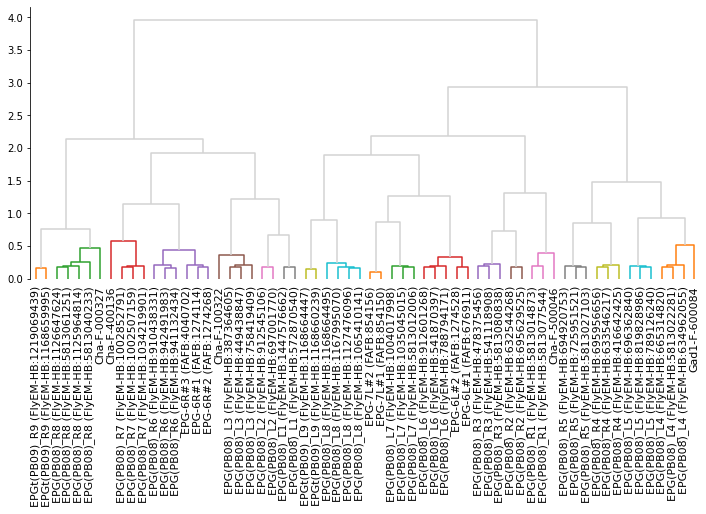

In [ ]:
# Plot a quick dendrogram
import matplotlib.pyplot as plt 
import seaborn as sns 

# Generate the canvas
fig, ax = plt.subplots(figsize=(12, 5))

# Make some more meaningful labels 
vfb2name = dict(zip(eb_pb.id, eb_pb.name))
labels = dist_mean.index.map(lambda x: vfb2name[x].split(' - ')[0])

# Plot the dendrogram
dn = dendrogram(Z, ax=ax, labels=labels, color_threshold=.65, above_threshold_color='lightgrey')

# Make xticks biggger
ax.set_xticklabels(ax.get_xticklabels(), size=11)

# Clean axes
sns.despine(bottom=True)

In [ ]:
# Make cluster matching the color threshold in the dendrogram
clusters = fcluster(Z, t=.65, criterion='distance')
clusters

array([12, 19,  2, 14,  2, 12, 10, 11, 15,  3,  3, 15, 11,  5, 14, 18,  9,
        7, 19,  6,  5, 10,  4, 15,  8,  8,  5,  9,  4,  4, 16,  9,  3,  4,
       13, 13,  4,  2, 18,  3, 17, 12,  6, 12,  7, 16, 13,  5, 18,  1, 17,
        1, 19,  4, 19, 12, 16,  9,  2,  2, 17, 11], dtype=int32)

In [ ]:
# We have to downsample the neurons for visualization 
# because DeepNote enforces a limit on the size of plots
eb_pb_ds = eb_pb.downsample(10)

In [ ]:
# Make a color per cluster 
palette = sns.color_palette('tab20', max(clusters))
cmap = dict(zip(range(1, max(clusters) + 1), palette))

colors = [cmap[i] for i in clusters]

navis.plot3d(eb_pb_ds, color=colors, hover_name=True)